## Database

In [17]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt 
import matplotlib.patches as patches

from skimage.measure import regionprops, label, find_contours
from skimage import exposure
from skimage import data, img_as_float
from skimage import img_as_ubyte
from skimage.draw import polygon_perimeter

from itertools import product

import warnings

import sys, os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../..')))

from Lamp.preprocessing.preprocessing import * 

In [18]:
### Read Data ###

# Read inputs - In Disk
#root_load = 'C:/Users/nilso/Documents/EPFL/MA4/PDS Turberg/'
#folder_to_load = 'Cuttings_data/ML-V1/'

#root_load = 'C:/Users/nilso/Documents/EPFL/MA4/PDS Turberg/Rock_Cuttings_Characterisation/Cuttings_Characterisation/'
#folder_to_load = 'Data/Test/ML-V1/'

# Read inputs - In BackUp
root_load = 'E:/FileHistory/nilso/LAPTOP-154DU0LI/Data/C/Users/nilso/Documents/EPFL/MA4/PDS Turberg/'
folder_to_load = 'Cuttings_data/BL3-4-DL/'

train_tiffs = os.listdir(os.path.dirname(root_load + folder_to_load)) # List of all files in the dir TODO Replace by user selection to load the data

tiff = train_tiffs[990] # Load one example
file_path = root_load + folder_to_load + tiff

### Save Outputs ###

root_save = 'C:/Users/nilso/Documents/EPFL/MA4/PDS Turberg/Rock_Cuttings_Characterisation/'

folder_to_save = 'Data/dev/'

save_path = root_save + folder_to_save # TODO Replace by user selection to load the data

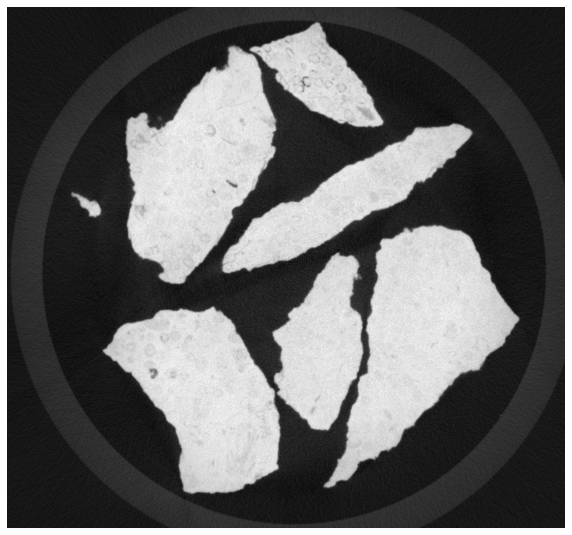

In [19]:
# Load the image
image_raw = Image_Raw(file_path,'unchanged')

image_raw.plot_new()

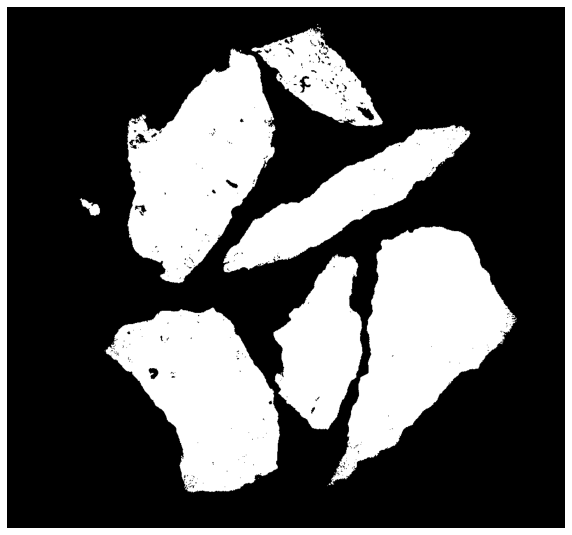

In [20]:
# First step : thresholding

Custom().apply(image = image_raw, thres = Otsu().return_threshold(image_raw))

image_raw.plot_new()
#plt.savefig(save_path+'algo_2.png',bbox_inches='tight')

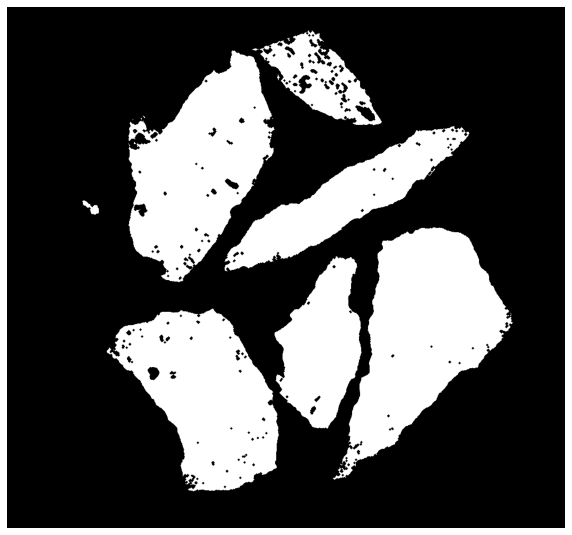

In [21]:
# Second step : erode to make sure that no cuttings are touching
selem = disk(2)
Erosion(selem=selem).apply(image_raw)

image_raw.plot_new()

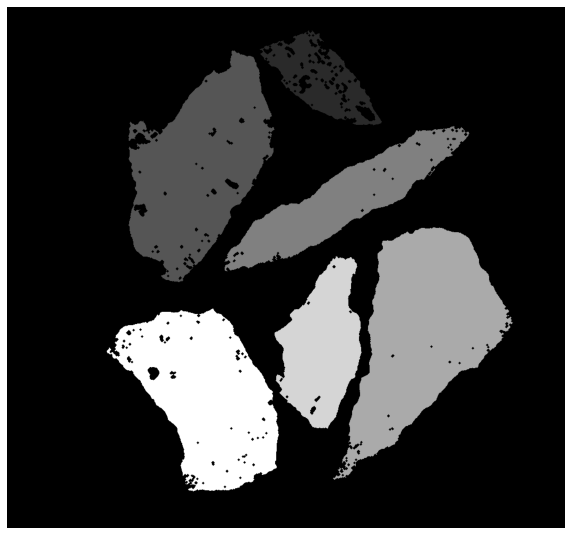

In [22]:
# Third step : Labelize to work with each cutting
Mask().apply(image_raw)
Labelize().apply(image_raw,threshold=5000)

image_raw.plot_labels()

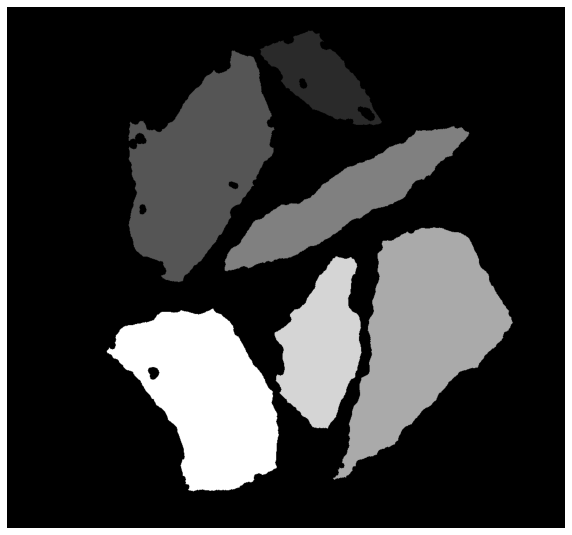

In [23]:
# Fourth step : closing of small holes inside the cuttings
selem = disk(5)
Closing(selem=selem).apply_regions(image_raw)

image_raw.plot_labels()

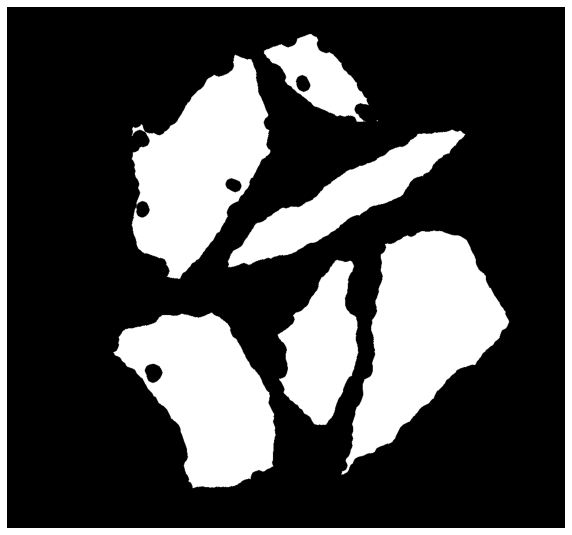

In [24]:
# Fourth step : erode to make sure that no cuttings are touching
selem = disk(3)
Erosion(selem=selem).apply(image_raw, 2)

image_raw.plot_new()


In [25]:
# Fifth step : labelize
Mask().apply(image_raw)
Labelize().apply(image_raw,threshold=10000)

#image_raw.plot_labels()
#plt.savefig(save_path+'algo_3.png',bbox_inches='tight')


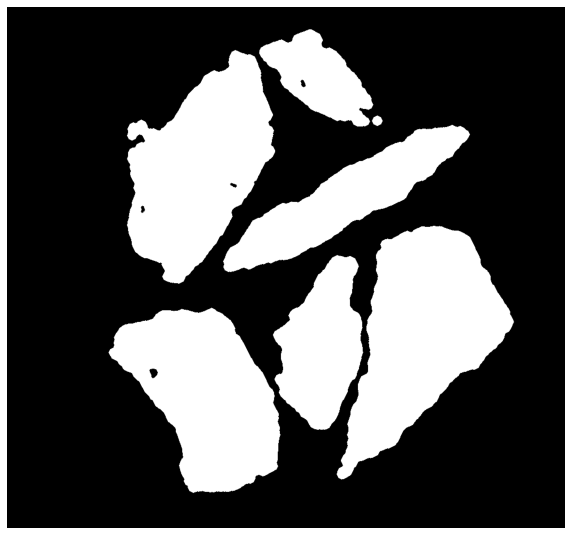

In [26]:
# Sixth step : dilate the image to retrieve the original cuttings size
selem = disk(3)
Dilation(selem=selem).apply(image_raw,3)

image_raw.plot_new()
#plt.savefig(save_path+'algo_4.png',bbox_inches='tight')

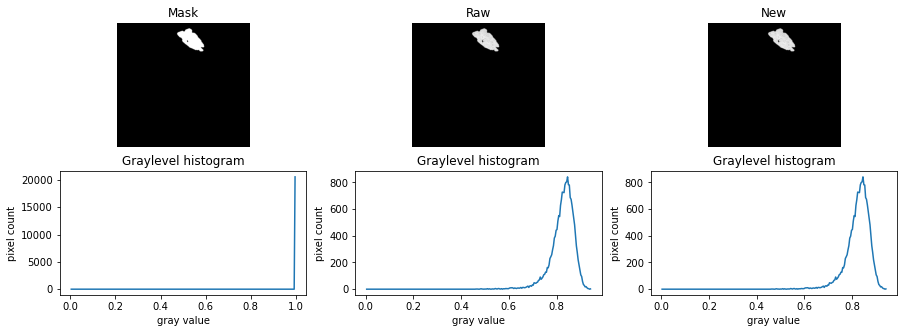

In [27]:
fig, ax = plt.subplots(2,3, figsize=(15,5))

for i_, (img, name) in enumerate(zip([image_raw.regions[0]['whole_mask'],image_raw.regions[0]['whole_raw'],image_raw.regions[0]['whole_new']],['Mask','Raw','New'])):
    ax[0,i_].imshow(img, cmap='gray')
    ax[0,i_].set_title(name)
    ax[0,i_].axis('off')
    
    histogram, bin_edges = np.histogram(img, bins=256)
    ax[1,i_].plot(bin_edges[1:-1], histogram[1:])
    ax[1,i_].set_title("Graylevel histogram")
    ax[1,i_].set_xlabel("gray value")
    ax[1,i_].set_ylabel("pixel count")


In [28]:
# Sixth step : rescale each region 

Rescale_Intenstiy().apply_regions(image_raw, in_range=(1,99), out_range = (0,1), background=False)

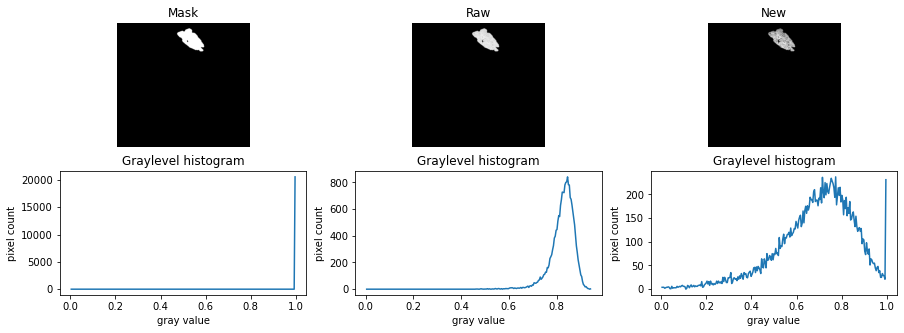

In [29]:
fig, ax = plt.subplots(2,3, figsize=(15,5))

for i_, (img, name) in enumerate(zip([image_raw.regions[0]['whole_mask'],image_raw.regions[0]['whole_raw'],image_raw.regions[0]['whole_new']],['Mask','Raw','New'])):
    ax[0,i_].imshow(img, cmap='gray')
    ax[0,i_].set_title(name)
    ax[0,i_].axis('off')
    
    histogram, bin_edges = np.histogram(img, bins=256)
    ax[1,i_].plot(bin_edges[1:-1], histogram[1:])
    ax[1,i_].set_title("Graylevel histogram")
    ax[1,i_].set_xlabel("gray value")
    ax[1,i_].set_ylabel("pixel count")

In [30]:
define_regions(image_raw)

C:\Users\nilso\Anaconda3\lib\site-packages\skimage\util\dtype.py:525: UserWarning: Downcasting int32 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)


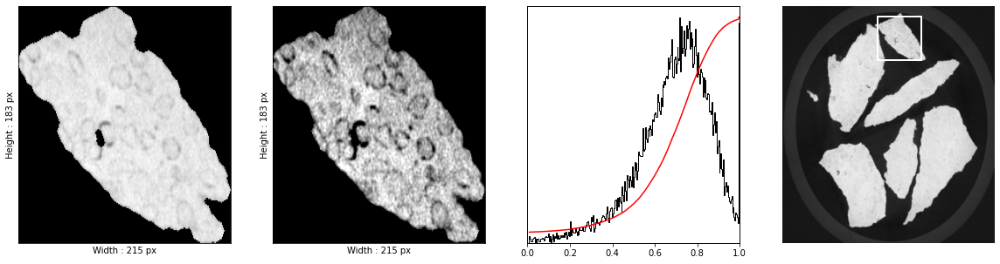

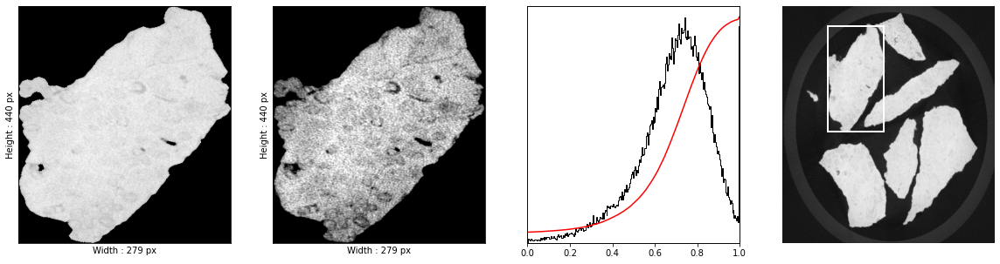

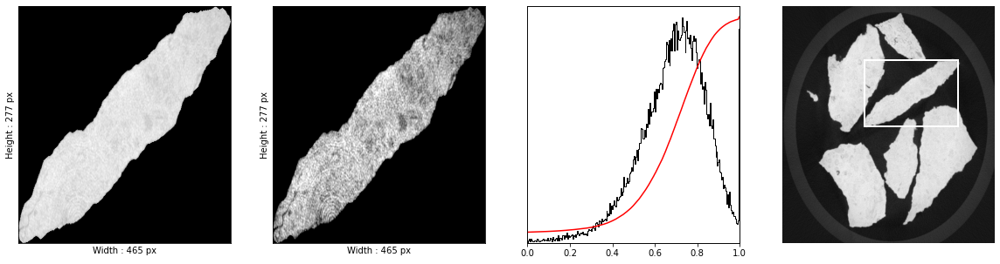

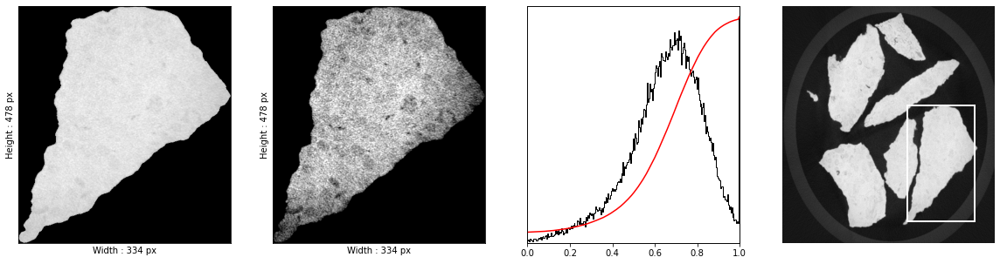

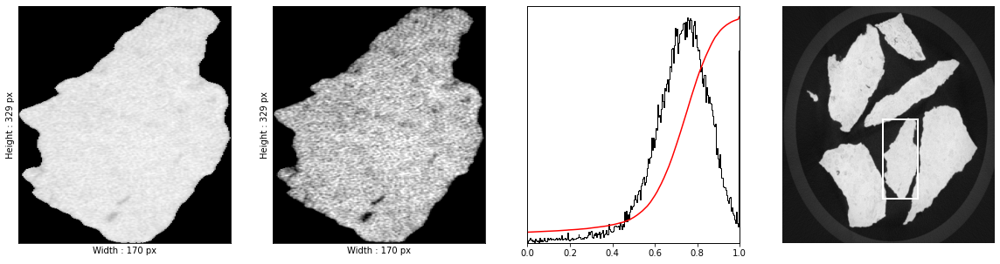

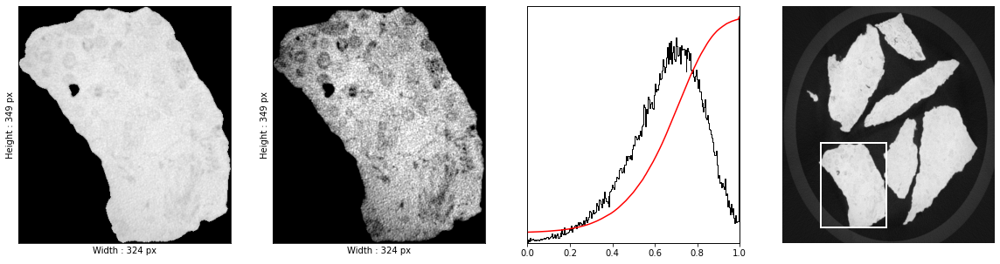

In [31]:
plot_regions(image_raw,type='bbox')

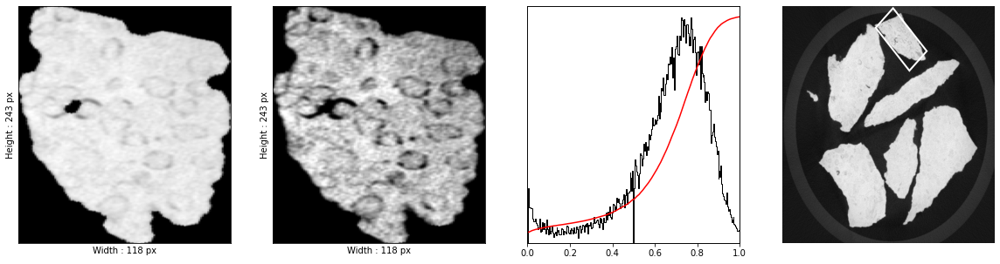

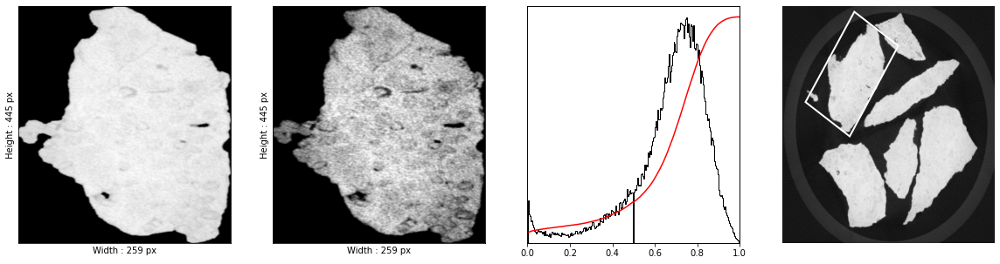

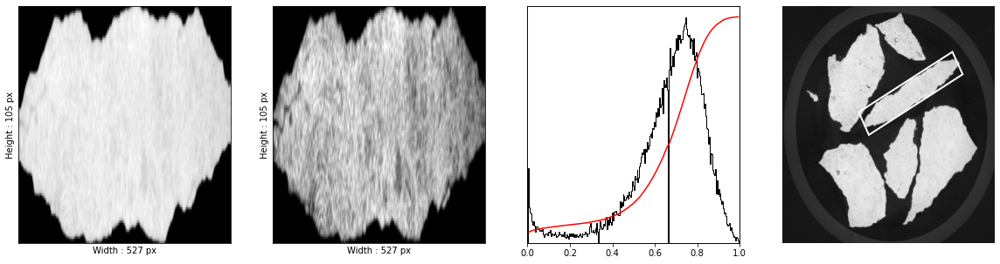

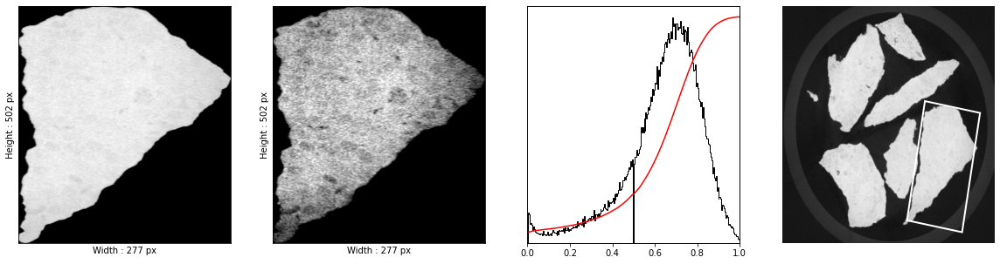

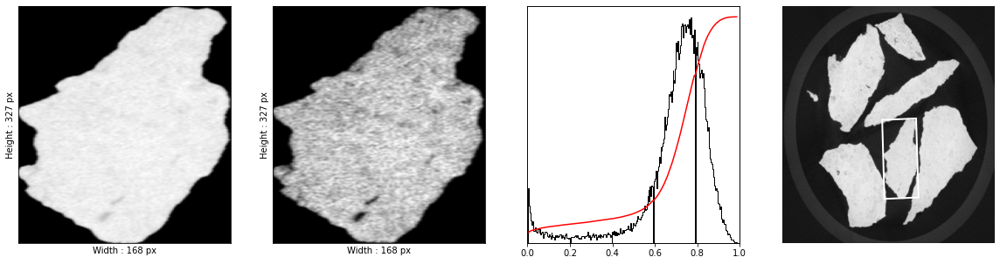

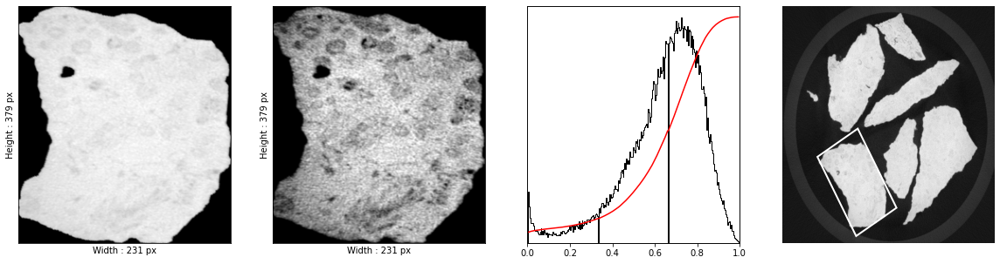

In [32]:
plot_regions(image_raw,type='mar')

## Training Data

In [33]:
# Read inputs - In BackUp
root_load = 'E:/FileHistory/nilso/LAPTOP-154DU0LI/Data/C/Users/nilso/Documents/EPFL/MA4/PDS Turberg/'
folder_to_load = 'Cuttings_data/ML-DB-Geo1/'

train_tiffs = os.listdir(os.path.dirname(root_load + folder_to_load)) # List of all files in the dir TODO Replace by user selection to load the data

tiff = train_tiffs[439] # Load one example
file_path = root_load + folder_to_load + tiff

(-3405.2000000000003, 71509.2)

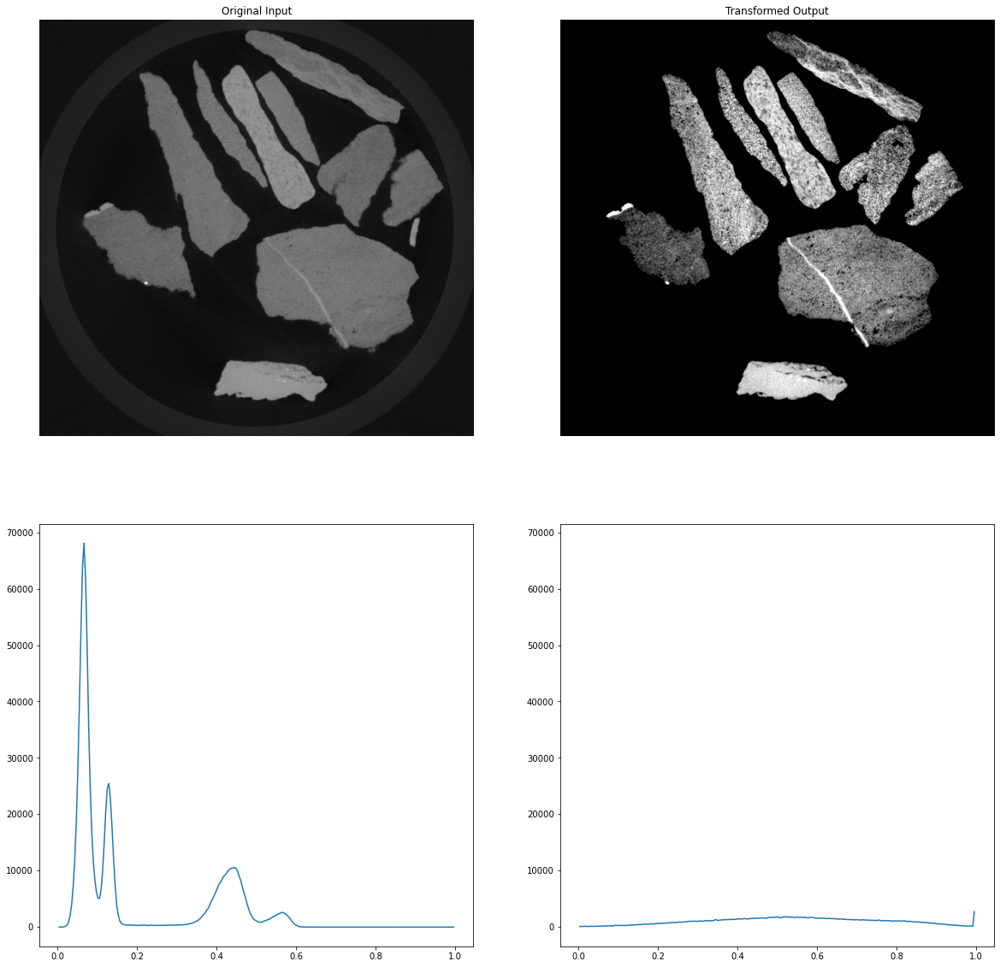

In [34]:
image_raw = Image_Raw(file_path,'unchanged')

# First
Custom().apply(image = image_raw, thres = Otsu().return_threshold(image_raw))

# Second 
selem = disk(2)
Erosion(selem=selem).apply(image_raw)

# Third
Mask().apply(image_raw)
Labelize().apply(image_raw,threshold=5000)

# Fourth
selem = disk(5)
Closing(selem=selem).apply_regions(image_raw)

# Fifth
selem = disk(2)
Erosion(selem=selem).apply(image_raw, 3)

# Sixth
Mask().apply(image_raw)
Labelize().apply(image_raw,threshold=5000)

# Seventh
selem = disk(2)
Dilation(selem=selem).apply(image_raw,4)

# Eigth
Rescale_Intenstiy().apply_regions(image_raw, in_range=(1,99), out_range = (0,1), background=False)

fig, ax = plt.subplots(2,2,figsize=(20,20))
ax[0,0].imshow(image_raw.img,cmap='gray')
ax[0,0].set_title('Original Input')
ax[0,0].axis(False)
ax[0,1].imshow(image_raw.new,cmap='gray')
ax[0,1].set_title('Transformed Output')
ax[0,1].axis(False)

ax[1,0].plot(image_raw.plot_cfd()[1][1:-1],image_raw.plot_cfd()[0][1:])
ax[1,1].plot(image_raw.plot_cfd_new()[1][1:-1],image_raw.plot_cfd_new()[0][1:]) # Start second element to remove background (0s)

ymin, ymax = ax[1,0].get_ylim()
ax[1,1].set_ylim(ymin, ymax)


In [35]:
define_regions(image_raw)

C:\Users\nilso\Anaconda3\lib\site-packages\skimage\util\dtype.py:525: UserWarning: Downcasting int32 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)


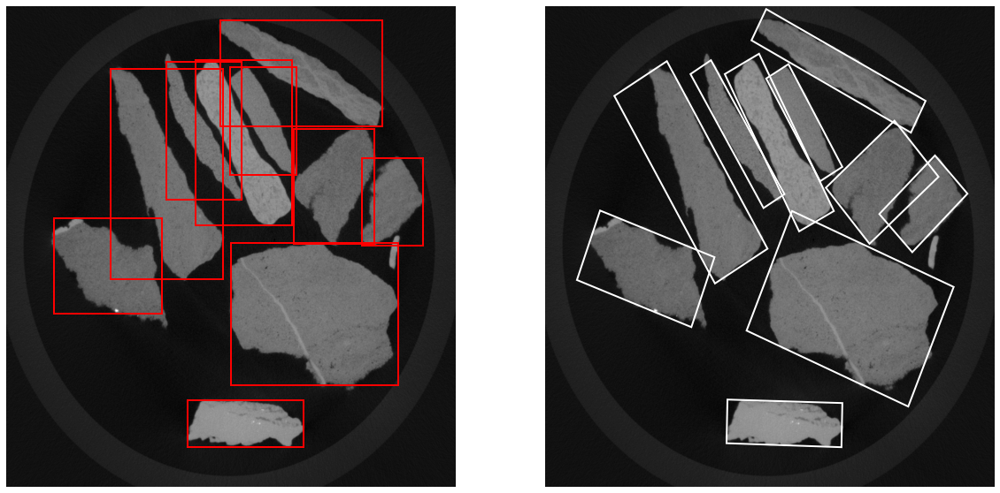

In [36]:
fig, ax = plt.subplots(1,2,figsize=(20,10))

ax[0].imshow(image_raw.img,
        cmap=plt.cm.gray,aspect="auto")
ax[0].axis(False)

ax[1].imshow(image_raw.img,
        cmap=plt.cm.gray,aspect="auto")
ax[1].axis(False)

for region in image_raw.regions:
    ax[0].add_patch(patches.Polygon(region['bbox']['box'],fill=False, edgecolor='red', linewidth=2))
    ax[1].add_patch(patches.Polygon(region['mar']['box'], fill=False, edgecolor='white', linewidth=2))

## Test Data

In [41]:
# Read inputs - In Disk
root_load = 'E:/FileHistory/nilso/LAPTOP-154DU0LI/Data/C/Users/nilso/Documents/EPFL/MA4/PDS Turberg/'
folder_to_load = 'Cuttings_data/ML-V1/'

train_tiffs = os.listdir(os.path.dirname(root_load + folder_to_load)) # List of all files in the dir TODO Replace by user selection to load the data

tiff = train_tiffs[439] # Load one example
file_path = root_load + folder_to_load + tiff

(-1023.2, 21487.2)

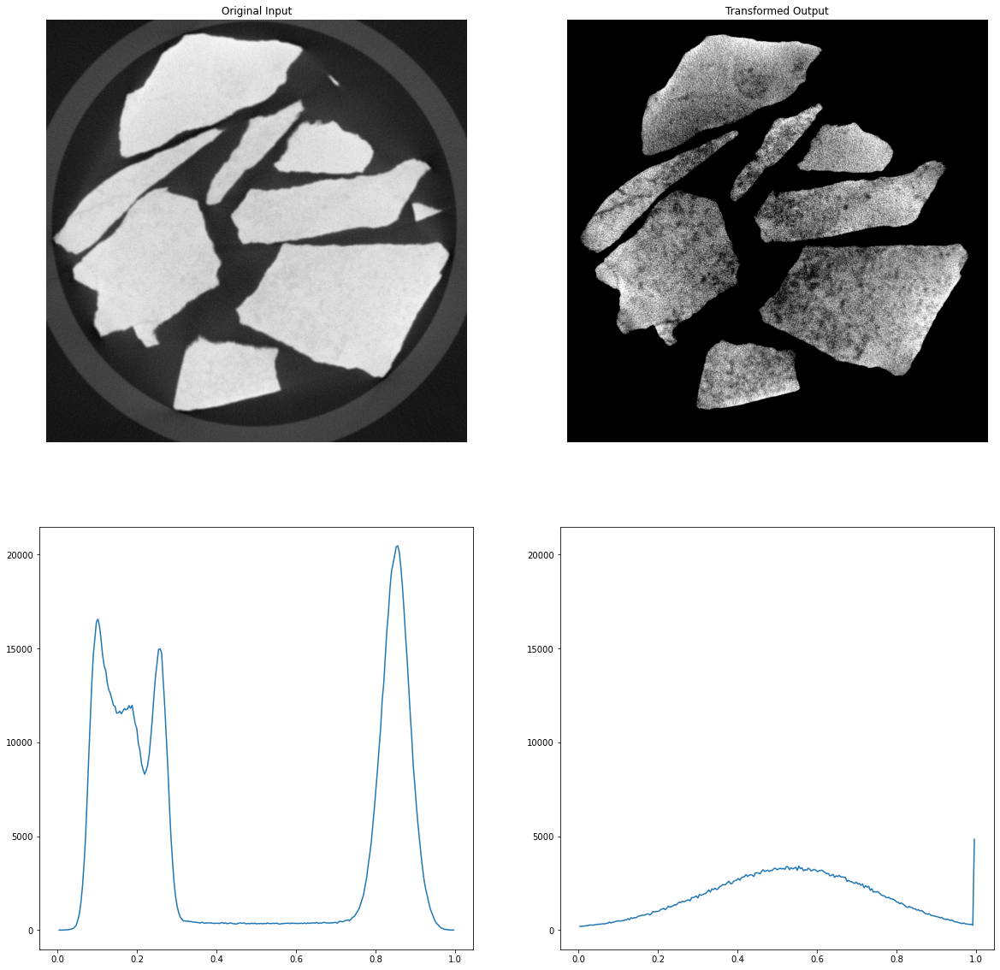

In [42]:
image_raw = Image_Raw(file_path,'unchanged')

# First
Custom().apply(image = image_raw, thres = Otsu().return_threshold(image_raw))

# Second 
selem = disk(2)
Erosion(selem=selem).apply(image_raw)

# Third
Mask().apply(image_raw)
Labelize().apply(image_raw,threshold=5000)

# Fourth
selem = disk(5)
Closing(selem=selem).apply_regions(image_raw)

# Fifth
selem = disk(2)
Erosion(selem=selem).apply(image_raw, 3)

# Sixth
Mask().apply(image_raw)
Labelize().apply(image_raw,threshold=5000)

# Seventh
selem = disk(2)
Dilation(selem=selem).apply(image_raw,4)

# Eigth
Rescale_Intenstiy().apply_regions(image_raw, in_range=(1,99), out_range = (0,1), background=False)

fig, ax = plt.subplots(2,2,figsize=(20,20))
ax[0,0].imshow(image_raw.img,cmap='gray')
ax[0,0].set_title('Original Input')
ax[0,0].axis(False)
ax[0,1].imshow(image_raw.new,cmap='gray')
ax[0,1].set_title('Transformed Output')
ax[0,1].axis(False)

ax[1,0].plot(image_raw.plot_cfd()[1][1:-1],image_raw.plot_cfd()[0][1:])
ax[1,1].plot(image_raw.plot_cfd_new()[1][1:-1],image_raw.plot_cfd_new()[0][1:]) # Start second element to remove background (0s)

ymin, ymax = ax[1,0].get_ylim()
ax[1,1].set_ylim(ymin, ymax)


In [43]:
define_regions(image_raw)

C:\Users\nilso\Anaconda3\lib\site-packages\skimage\util\dtype.py:525: UserWarning: Downcasting int32 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)


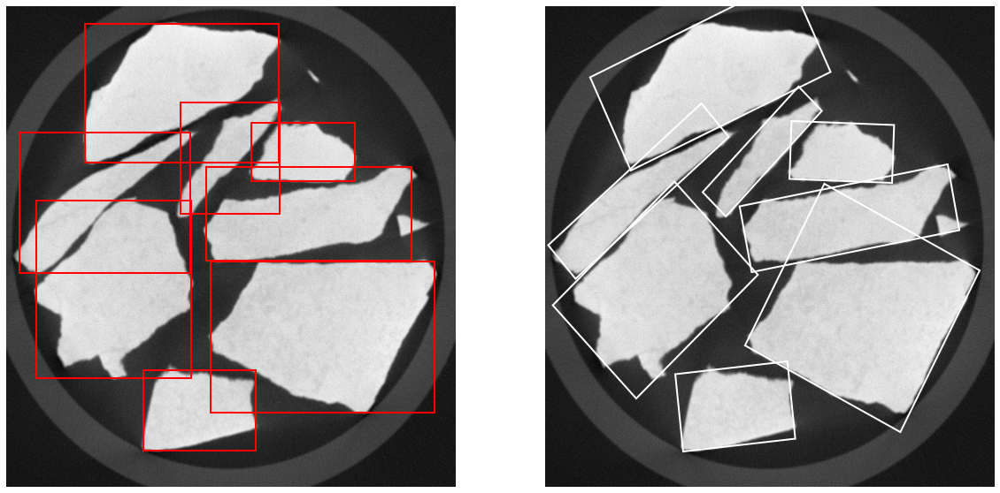

In [44]:
fig, ax = plt.subplots(1,2,figsize=(20,10))

ax[0].imshow(image_raw.img,
        cmap=plt.cm.gray,aspect="auto")
ax[0].axis(False)

ax[1].imshow(image_raw.img,
        cmap=plt.cm.gray,aspect="auto")
ax[1].axis(False)

for region in image_raw.regions:
    ax[0].add_patch(patches.Polygon(region['bbox']['box'],fill=False, edgecolor='red', linewidth=2))
    ax[1].add_patch(patches.Polygon(region['mar']['box'], fill=False, edgecolor='white', linewidth=2))

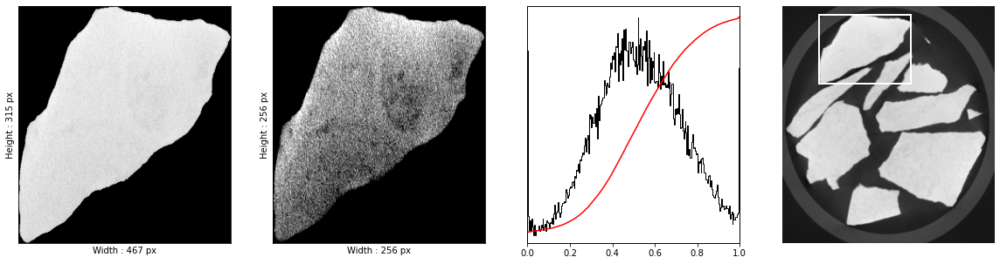

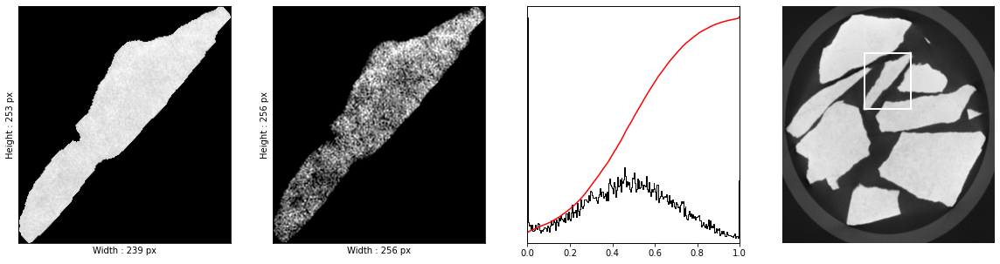

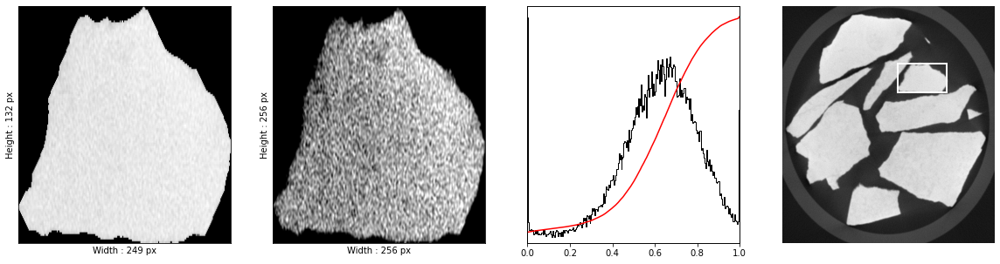

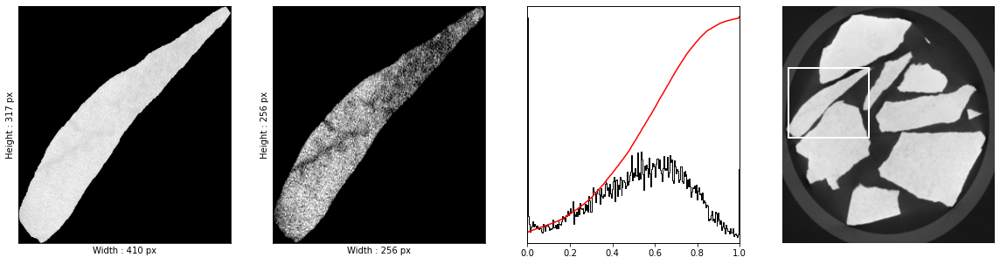

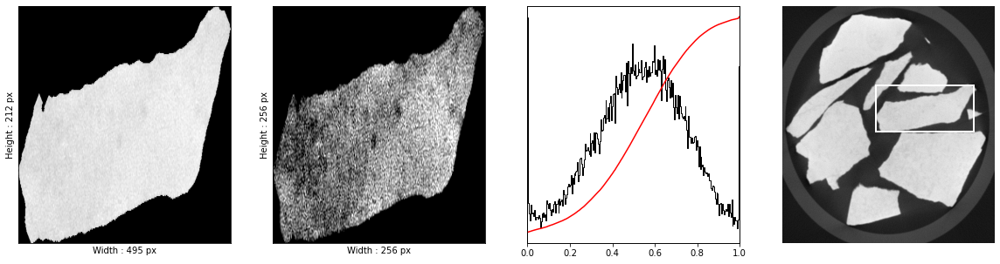

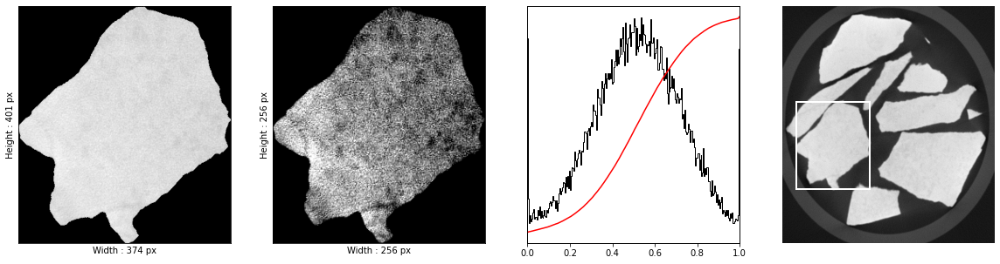

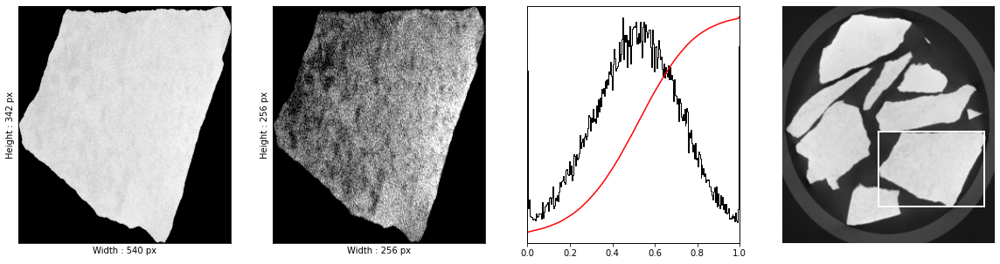

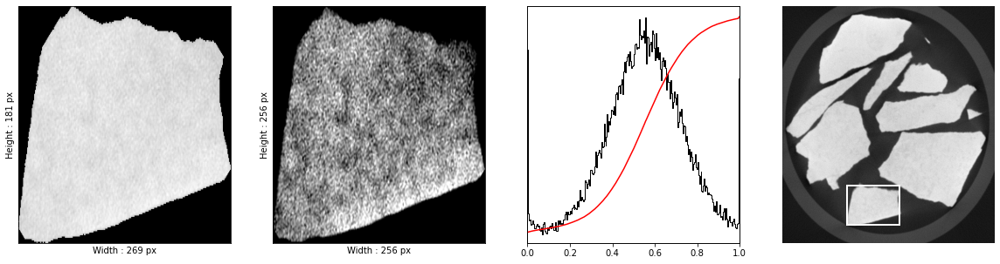

In [45]:
Resize(out_shape=256).apply_regions(image_raw,type='bbox',name='resized')

plot_regions(image_raw,type='bbox',name='resized')

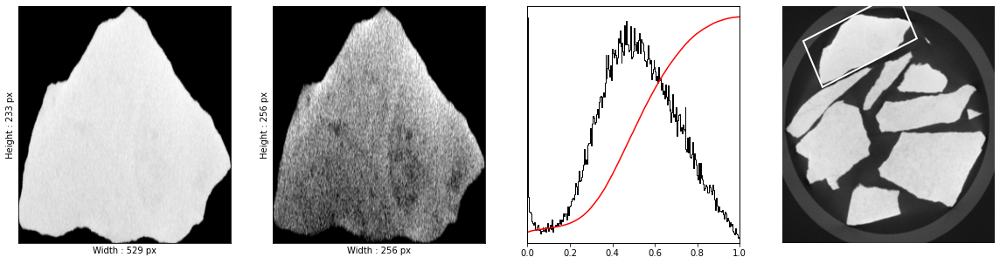

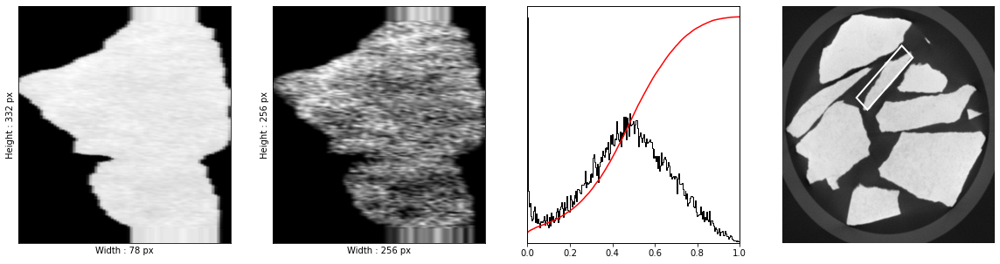

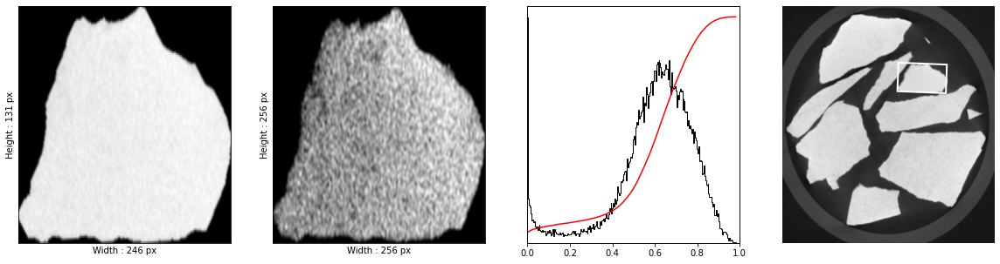

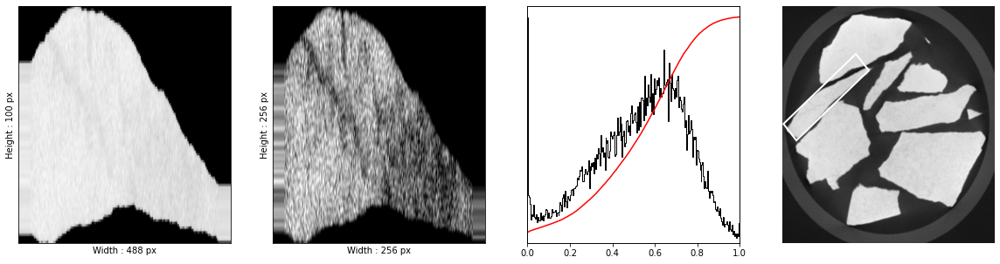

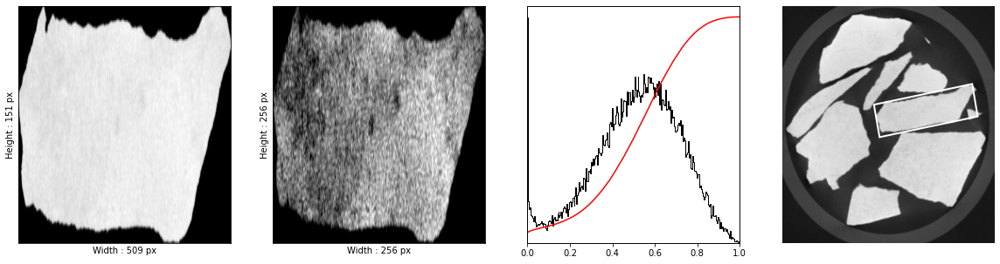

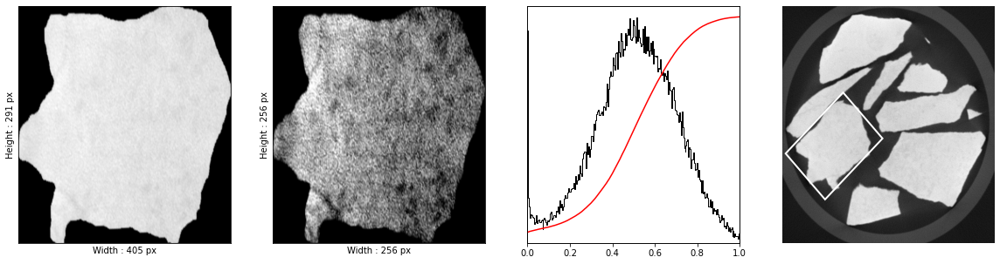

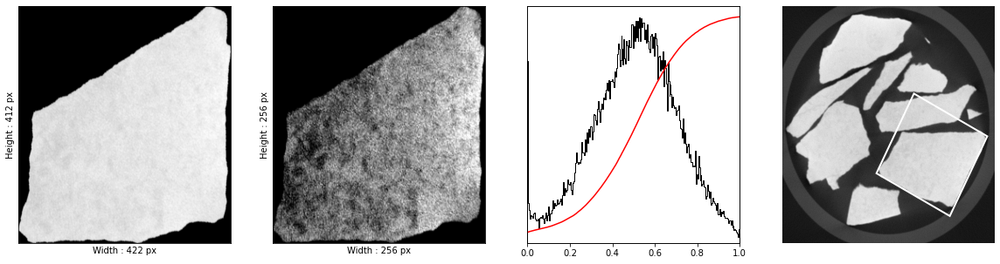

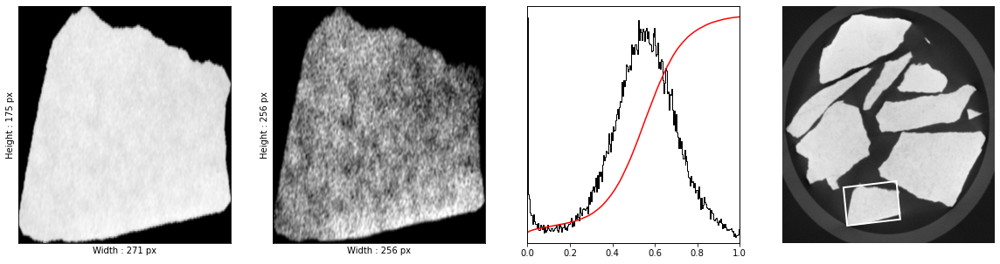

In [46]:
Resize(out_shape=256).apply_regions(image_raw,type='mar',name='resized')

plot_regions(image_raw,type='mar',name='resized')

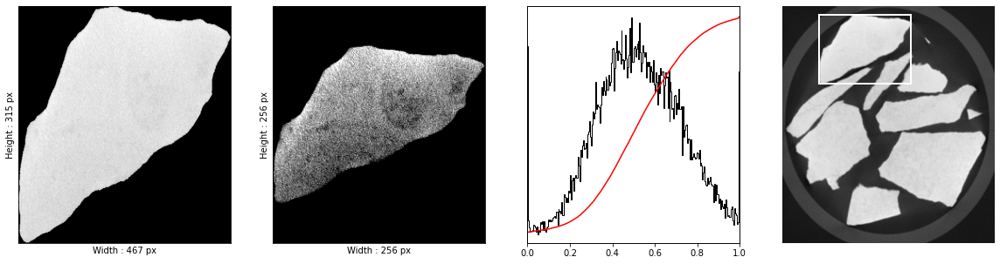

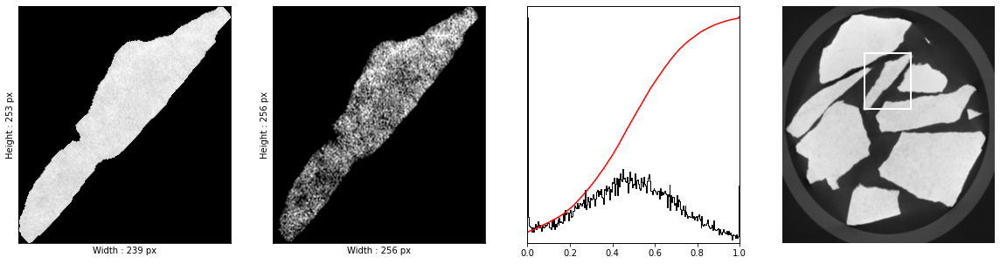

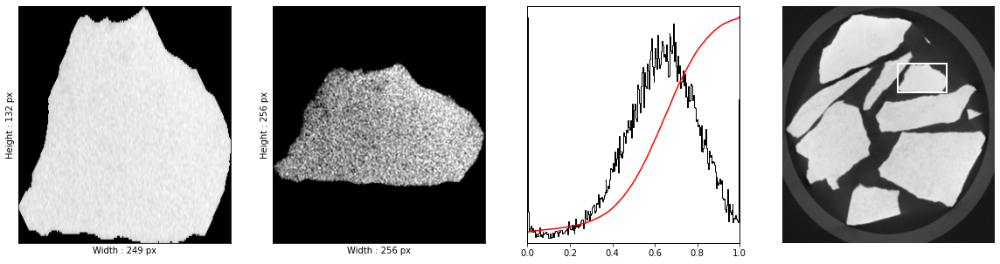

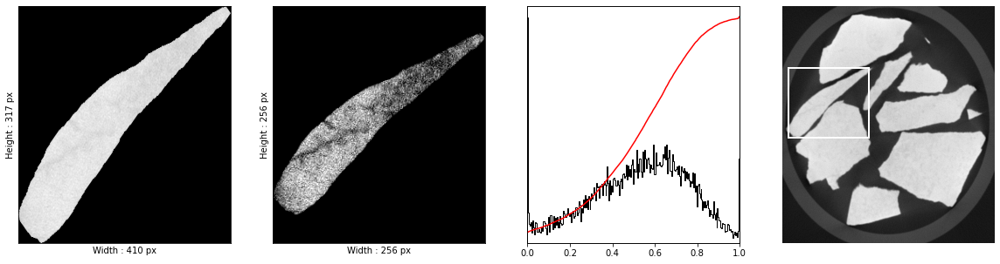

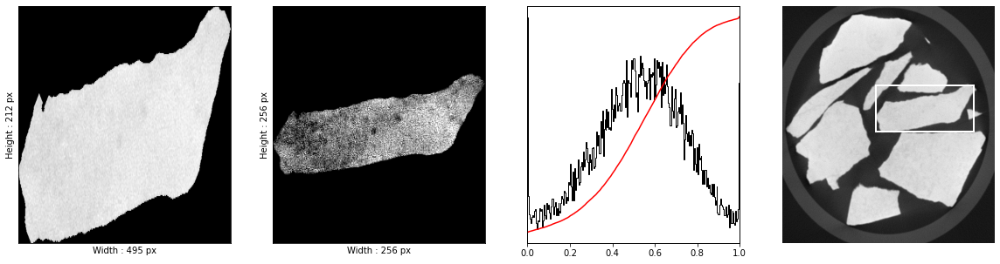

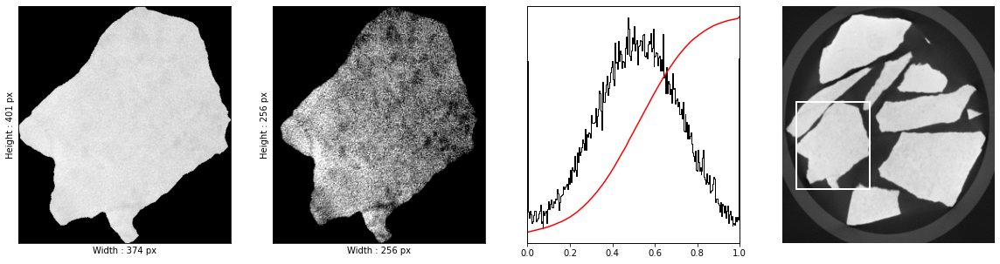

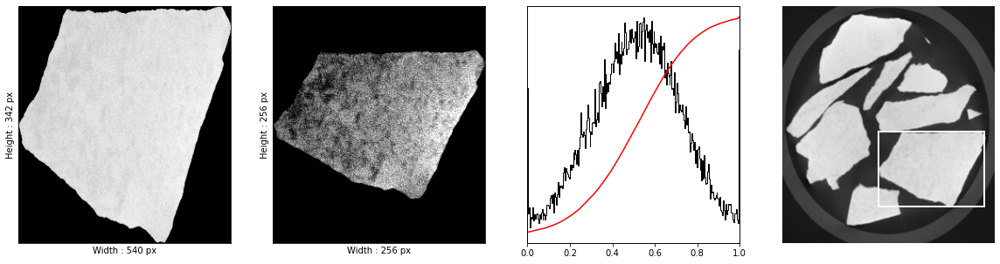

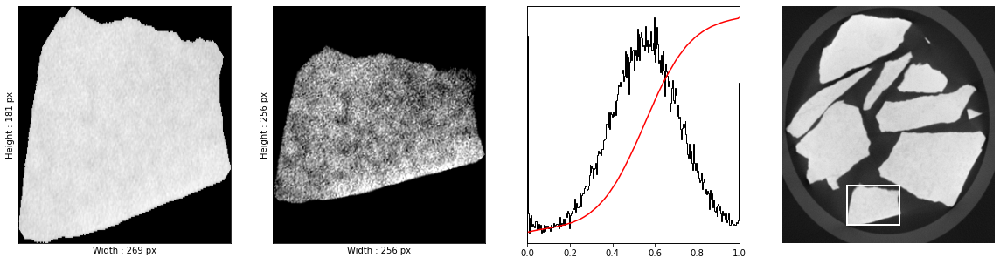

In [47]:
Padding(out_shape = 256).apply_regions(image_raw,type='bbox',name='padded')

plot_regions(image_raw,type='bbox',name='padded')

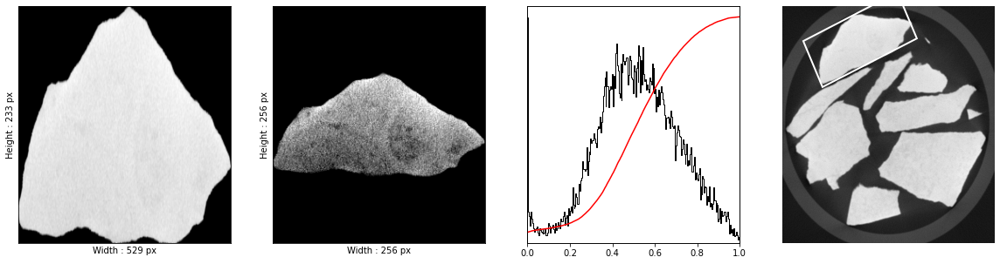

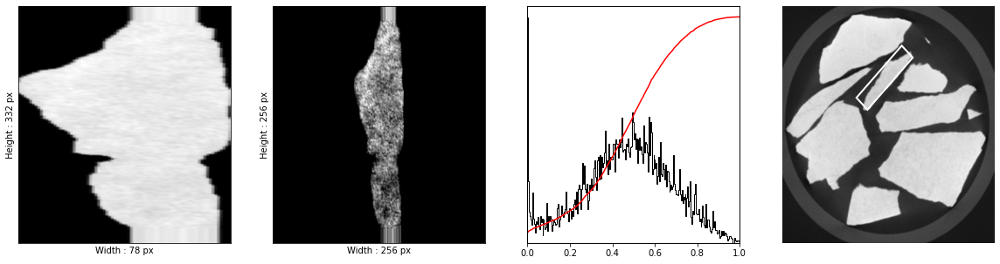

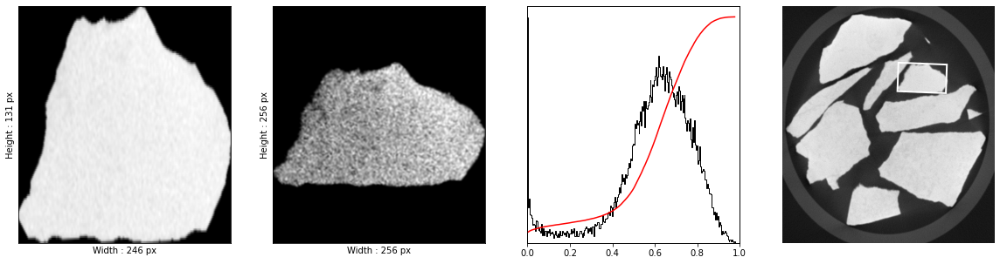

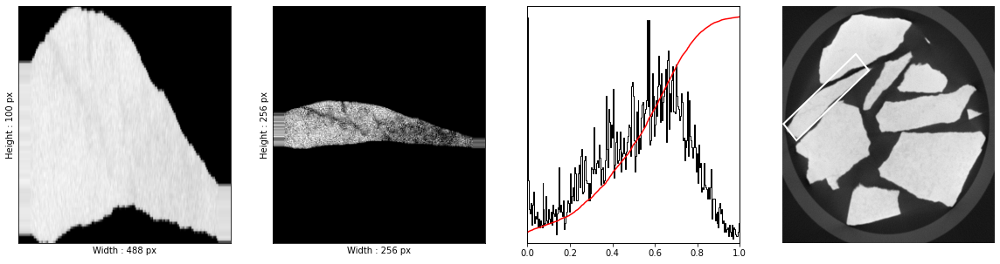

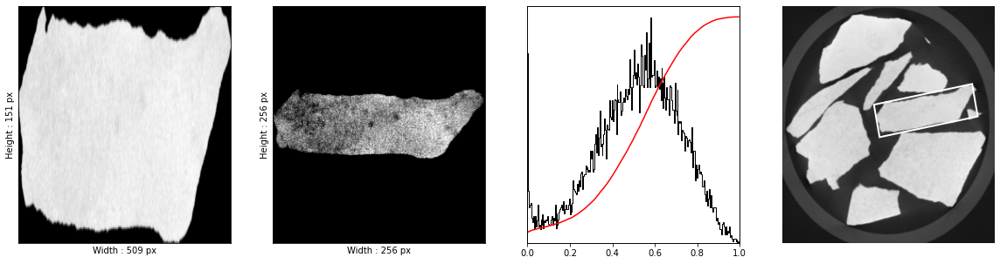

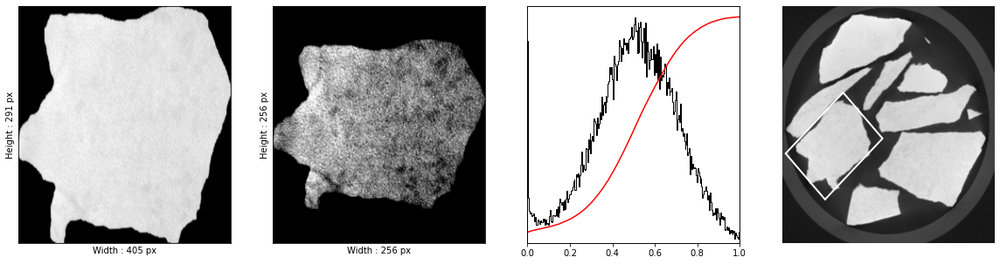

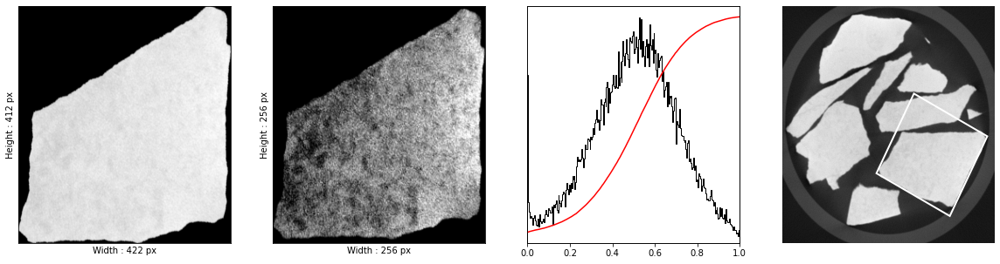

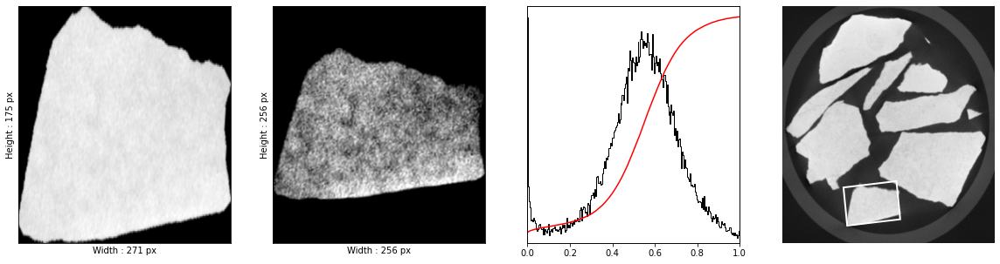

In [48]:
Padding(out_shape = 256).apply_regions(image_raw,type='mar',name='padded')

plot_regions(image_raw,type='mar',name='padded')

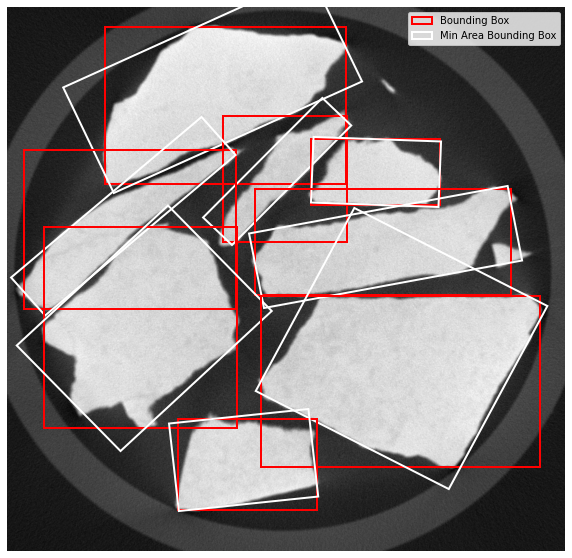

In [49]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

ax.imshow(image_raw.img,
        cmap=plt.cm.gray,aspect="auto")
ax.axis(False)

for region in image_raw.regions:
    ax.add_patch(patches.Polygon(region['bbox']['box'],fill=False, edgecolor='red', linewidth=2))
    ax.add_patch(patches.Polygon(region['mar']['box'], fill=False, edgecolor='white', linewidth=2))

leg = plt.gca().legend(('Bounding Box','Min Area Bounding Box'))
leg.legendHandles[0].set_color('red')
leg.legendHandles[1].set_color('white')

In [50]:
types = ['bbox','mar']
names = ['new','padded','resized']

In [57]:
if len(image_raw.regions) >= 9:

    for type_, name_ in product(types,names):
        print(type_,name_)

        fig, axs = plt.subplots(3,3,figsize=(7,7))
        axs = axs.ravel()

        for i_, region in enumerate(image_raw.regions[:9]):

            axs[i_].imshow(region[type_][name_],cmap='gray')
            axs[i_].axis(False)

#plt.savefig('experimental_set_up_padded.png',bbox_inches='tight',dpi=600)

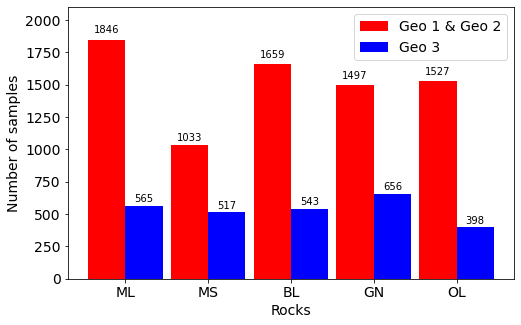

In [ ]:
# Train Test Split
labels = ['ML','MS','BL','GN','OL']

train = [1846,1033,1659,1497,1527]
test = [565,517,543,656,398]

ind = np.arange(len(labels))

bar_width = 0.45

fig, ax = plt.subplots(figsize=(8,5))
rects1 = ax.bar(ind, train, bar_width, color='r',
                label='Geo 1 & Geo 2')
rects2 = ax.bar(ind+bar_width, test, bar_width, color='b',
                label='Geo 3')
ax.set_xlabel('Rocks',fontsize=14)
ax.set_ylabel('Number of samples',fontsize=14)
ax.set_xticks(ind + bar_width / 2)

ax.set_xticklabels(labels,fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.ylim(0,2100)
for rect, tr in zip(rects1, train):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height*1.02, '{}'.format(tr), ha='center', va='bottom')
for rect, te in zip(rects2, test):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height*1.02, '{}'.format(te), ha='center', va='bottom')

plt.savefig('train_test_validation.png',dpi=600,bbox_inches='tight')